# End-to-End Multi-Class Dog Breed Classificaion

This notebook builds an end-to-end multiclass image classifier using TensorFlow 2.0 and Tensorflow Hub.

# 1. Problem

> Identify the bread of a dog given in an image of a dog.

# 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

# 3. Evaluation

For each image in the test set, you must predict a probability for each of the different breeds.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

# 4. Features

Some information about the data:


*   We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
*   There are 120 breeds of dogs (this means there are 120 different classes).
*   There are around 10,000+ images in the training set (these images have labels)
*   There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
#Unzip the uploaded data into google drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision"

# Get our workspace ready

* Import Tensorflow 2.x
* Import Tensorflow Hub
* Make sure we're using a GPU

In [ ]:
# Import tensorflow into colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.15.0


In [ ]:
#Optional
# If you have lower version of tensorflow by default (<2.x), then follow this steps:
# Import TF 2.x

# Code:

# try:
#   #%tensorflow_version only exists in Colab
#   %tensorflow_version 2.x
# except Exception:
#   pass

# import tensorflow as tf
# print("TF version:", tf.__version__)

In [ ]:
#import the tensorflow hub
import tensorflow_hub as hub
print("Hub version:", hub.__version__)

#Check for GPU availability
print("GPU", "available!" if tf.config.list_physical_devices("GPU") else "not available :(")

Hub version: 0.16.1
GPU available!


##To activate GPU
Runtime -> change runtime type -> Hardware accelerator -> T4 GPU -> Save


# Getting Our Data Ready ( turning into tensors)

With all macine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation).

Let's start by accessing our data and checking out the labels.

In [ ]:
#checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.head())
print(labels_csv.describe())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there for each dog breed?
labels_csv["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

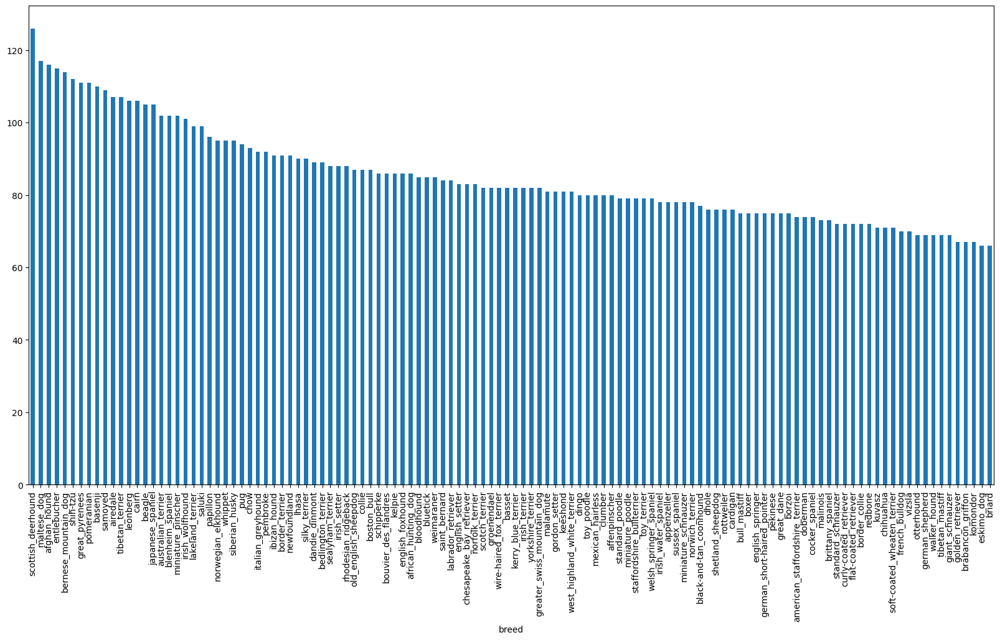

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
#What's the median number of images per class?
labels_csv["breed"].value_counts().median()

82.0

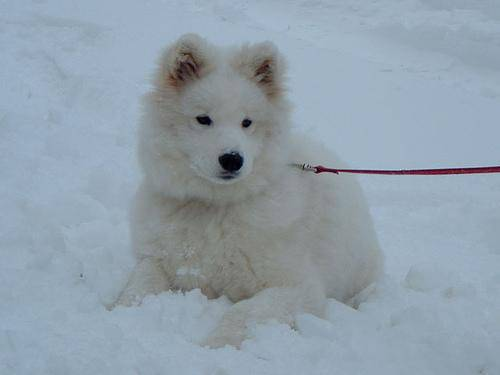

In [ ]:
# Let's veiw an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/01b36cb1b80ab8c3a7d2b7128ad21bdc.jpg")

## Getting images and their labels

Let's get a list of all our images file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg"  for fname in labels_csv["id"]]

#check the first 10
filenames

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog Vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
# check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("File match actual amount of files!!! Proceed.")
else:
  print("File mismatch actual amount of files, check the target directory.")

File match actual amount of files!!! Proceed.


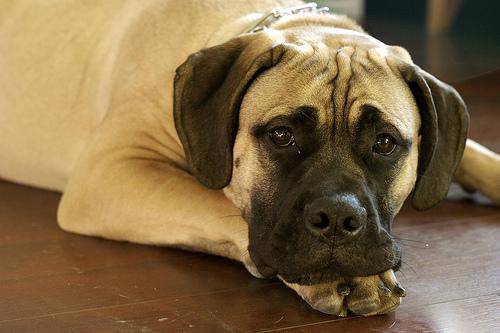

In [ ]:
#One more check
Image(filenames[1507])

In [ ]:
labels_csv["breed"][1507]

'bull_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the numer of filenames
if len(labels) == len(filenames):
  print("number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

number of labels matches number of filenames!


In [ ]:
#Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into a boolean array
boolean_labels = [label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
#Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(np.where(boolean_labels[0]==True)) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # convert boolean array to integers, there will be 1 where the sample label occurs

boston_bull
(array([19]),)
(array([19]),)
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own Validation dataset
Since our kaggle dataset doesn't provide validation set, we'll create our own .

In [ ]:
# Setup x and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# set number of images to use for experimenting
NUM_IMAGES = 1000  #@param {type: "slider", min:1000, max: 10000, step:10}

In [ ]:
#Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
#Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42
                                                  )
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:2],y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

# Preprocessing images (turning images into tensors)
 To preprocess our images into Tensors. we're going to write a function which does a few things :
 1. Take an image filepath as input
 2.  Use Tensorflow to read the file and save it to a variable `image`
 3. Turn our `image` (a jpg) into Tensors
 4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
 5. Resize the `image` to a shape of (224, 224)
 6. Return the modified `image`

 Before that, Let's see what importing an image look like:


In [ ]:
#convert image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
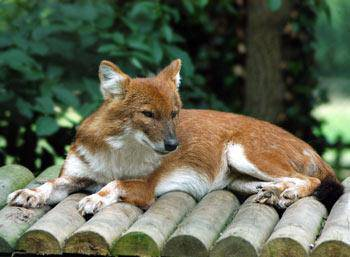

In [ ]:
image

In [ ]:
#convert image into tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a tensor, let's make a function to preprocess them.
1. Take an image filepath as input
2.  Use Tensorflow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to a shape of (224, 224)
6. Return the modified `image`


In [ ]:
#Define image size
IMG_SIZE = 224

#create a function for preprocessing image
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath as input and returns a tensor version of the image of the same size as IMG_SIZE.
  """
  #read in an image file
  image = tf.io.read_file(image_path)
  #Turn the jpeg image into numerical Tensor with 3 colour channels (Red , Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  #convert the color channel values from 0-255 to 0-1 values (normalization)
  image = tf.image.convert_image_dtype(image,tf.float32)
  # resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])

  return image


In [ ]:
# tensor = tf.io.read_file(filenames[42])
# tensor

In [ ]:
# filenames[42]

In [ ]:
# tf.image.decode_jpeg(tensor, channels=3)

In [ ]:
# tf.image.convert_image_dtype(image,tf.float32)

In [ ]:
# tf.image.resize(image, size=[224,224]).shape

## Turning our data into batches

**WHY BATCHES?**

Let's say you're trying to process 10,000+ images in one go...they all might not fit into memory.

So that's why we do about 32 (this is recommended batch size) images at a time , you can manually adjust the batch size as needed.

In order to us Tensorflow essectively, we need our data in the form of tensors tuples which look like (image, label)

In [ ]:
#create a simple function to retunr a tuple (image,label)
def get_image_label(image_path,label):
  """
  Takes an image filepath as input and returns a tuple (image,label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
#demo of above function
#(process_image(X[42]),tf.constant(y[42]))

Now we've got a way to turn our data into tuples of tensors in the form : `(image, label)`, let's make a funtion to turn all our data `(X & y )` into batches!

In [ ]:
#Definee the batch size , 32 is a good start
BATCH_SIZE = 32

#Create a function to turn data into batches
def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation ata.
  Also accepts test data as input (no labels).
  """
  #if the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation in batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #fliepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    #turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    #shuffling pathnames and labels before mapping image processor function is faster tha shuffling images
    data = data.shuffle(buffer_size=len(X))

    #create (image, label) tuples (this also turns the image path into a processed image)
    data = data.map(get_image_label)

    #turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
#create training an validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val, valid_data=True)

Creating training data batches...
Creating validation in batches...


In [ ]:
#check out the different atttributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:

import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:

train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

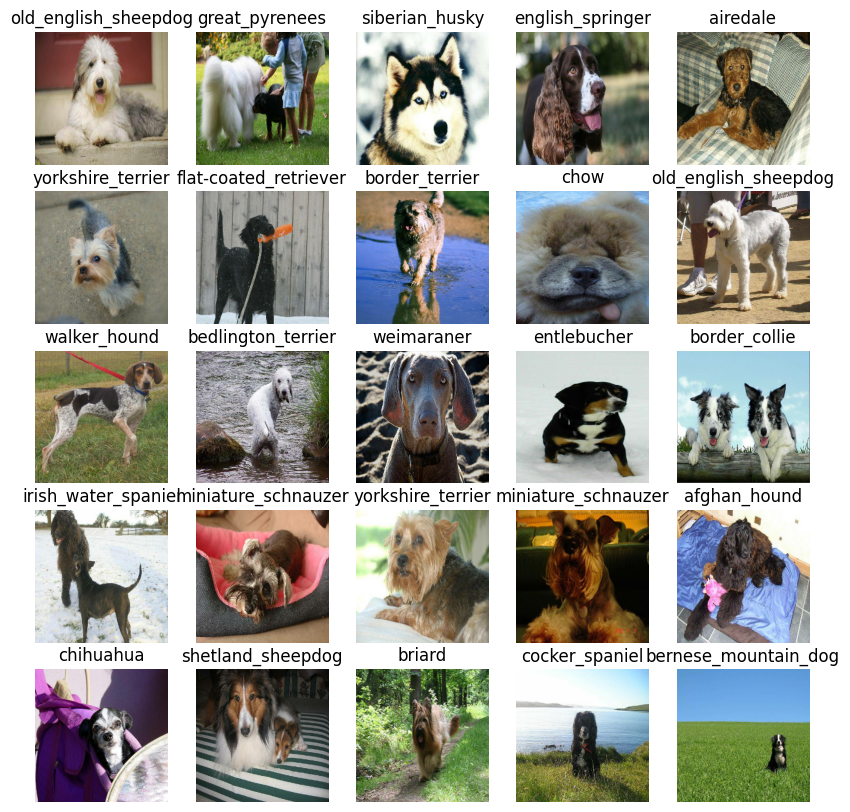

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

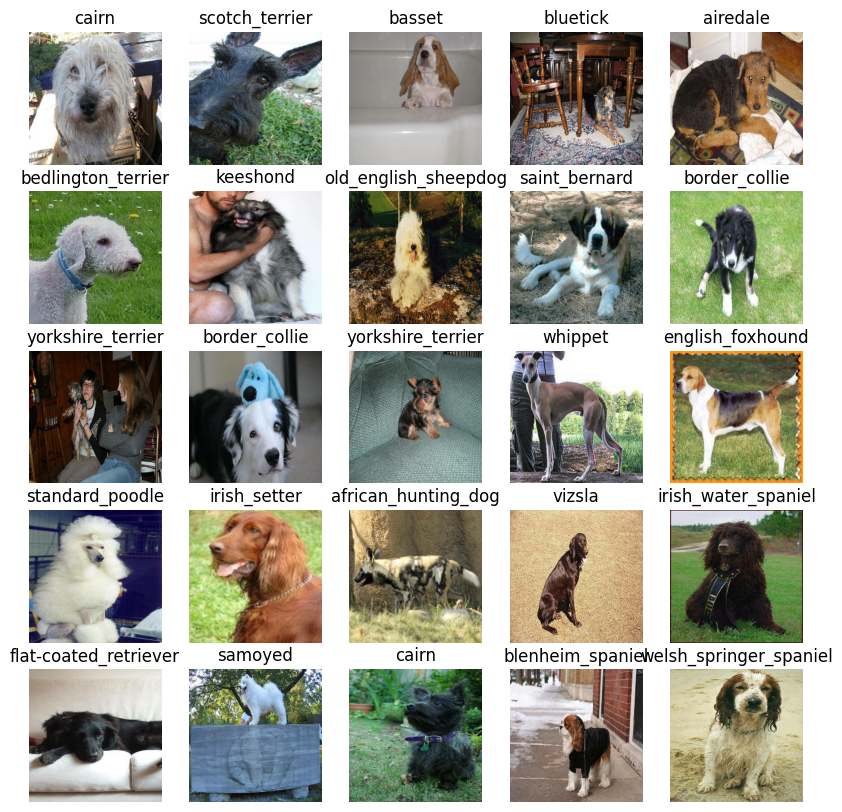

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model
Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in
the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
INPUT_SHAPE


[None, 224, 224, 3]


Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress or stop strainging early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our modle from training for too long.

# TensorBoard Callback

To setup Tensorboard callback , we need to do 3 things:

1. Load the TensorBoard notebook extension
2. Create TensorBoard callback which is able to save logs to directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with `%tensorboard` magic function (after model training)

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
#Load tensorBoard notebook extetnsion
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) #stop the training automatically if 3 consecutive epochs accuracy of validation set is same


# Training a model (on subset of data)

Our first model is only going to train on 1000 images , to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [ ]:
#Check to make sure we're still running on a GPU
print("GPU", "available!" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available!


Let's create a function which trains a model .


*   Create a model using `create_model()`
*   Setup a TensorBoard callback using `create_tensorboard_callback()`
*   Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use .
*   Return the model



In [ ]:
#build a funnction to train and return a trained model
def train_model():
  """
  Train a given model and returns the trained version
  """
  #create the model
  model = create_model()

  #create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, #runs validation every 1 epochs.
            callbacks=[tensorboard,early_stopping])
  #return the fitted model
  return model

In [ ]:
#fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 10s 222ms/step - loss: 4.4960 - accuracy: 0.1112 - val_loss: 3.3920 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 4s 165ms/step - loss: 1.5974 - accuracy: 0.6888 - val_loss: 2.1502 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 4s 146ms/step - loss: 0.5526 - accuracy: 0.9475 - val_loss: 1.6600 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 7s 303ms/step - loss: 0.2482 - accuracy: 0.9900 - val_loss: 1.4691 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 4s 139ms/step - loss: 0.1408 - accuracy: 0.9975 - val_loss: 1.3861 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 4s 164ms/step - loss: 0.0986 - accuracy: 0.9987 - val_loss: 1.3512 - val_accuracy: 0.6200
Epoch 7/100
25/25 [=============================

## Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

# Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 161ms/step


array([[2.0075039e-04, 1.0765421e-04, 6.4604363e-04, ..., 4.8058829e-04,
        4.9076980e-06, 1.6172453e-03],
       [2.1244029e-03, 9.2951342e-04, 4.4559943e-03, ..., 2.8248326e-04,
        4.3488145e-04, 1.3431160e-04],
       [4.3829925e-05, 1.1692216e-04, 2.0170351e-05, ..., 3.8115741e-05,
        1.2212145e-04, 2.1224369e-04],
       ...,
       [9.1978609e-06, 1.3965363e-05, 2.6446462e-05, ..., 2.8619148e-05,
        3.8668036e-04, 8.9069821e-05],
       [7.1161537e-04, 5.3472966e-05, 3.5580888e-04, ..., 1.4103192e-04,
        4.8921855e-05, 6.9132675e-03],
       [4.3716200e-04, 4.9383554e-05, 1.5232646e-03, ..., 2.8936493e-03,
        4.1930069e-04, 2.1952223e-05]], dtype=float32)

In [ ]:
predictions[0]

array([2.00750394e-04, 1.07654210e-04, 6.46043627e-04, 1.83205208e-04,
       1.05085573e-03, 2.82314832e-05, 1.90609824e-02, 3.35311372e-04,
       1.53068730e-04, 4.72332555e-04, 1.05647184e-03, 3.03512992e-04,
       1.10402827e-04, 1.40300021e-04, 1.37027047e-04, 5.18070068e-04,
       3.50168011e-05, 1.17351972e-01, 5.97821509e-06, 3.41736195e-05,
       6.48551431e-05, 5.32532831e-05, 2.76707051e-05, 3.06240079e-04,
       7.01933095e-05, 3.83971230e-04, 1.31753504e-01, 1.53470697e-04,
       4.97365720e-04, 2.40109977e-04, 6.27538029e-05, 4.97687957e-04,
       2.85901036e-03, 1.39984204e-05, 7.27642400e-05, 2.90346276e-02,
       5.55863953e-05, 4.26777318e-04, 4.44097423e-05, 6.94768969e-05,
       3.98029806e-04, 1.65559486e-05, 1.11703055e-04, 6.58726931e-05,
       1.25825782e-05, 1.37343843e-04, 2.21897026e-05, 1.63040764e-04,
       5.89342322e-04, 8.45452421e-04, 3.97642230e-04, 3.06983093e-05,
       3.26015142e-04, 7.40489559e-05, 2.90933058e-05, 4.71437670e-05,
      

In [ ]:
#first prediction
index = 42
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"Prediction label: {unique_breeds[np.argmax(predictions[index])]}")

Max value (probability of prediction): 0.5636049509048462
Sum: 1.0000001192092896
Max index:113
Prediction label: walker_hound


In [ ]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#create a function to unbatch a batvh dataset
def unbatcify(data):
  """
  Takes a batched dataset of (image, label) pairs and returns separate arrays for images and labels.
  """
  images = []
  labels = []
  #loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

#unbatchify the validation data
val_images, val_labels = unbatcify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prod, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #get the pred label
  pred_label = get_pred_label(pred_prod)

  #plot the target image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #change plot title to be predicted, probabilty of prediction and truth label
  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                       100*np.max(pred_prod),
                                       true_label),
                                       color=color)

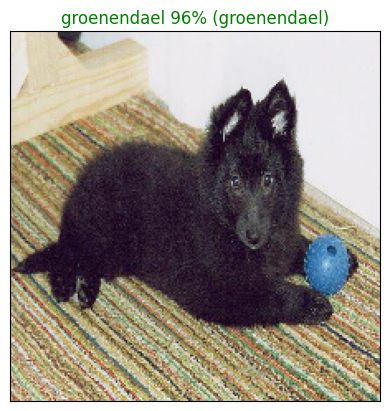

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [ ]:

def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

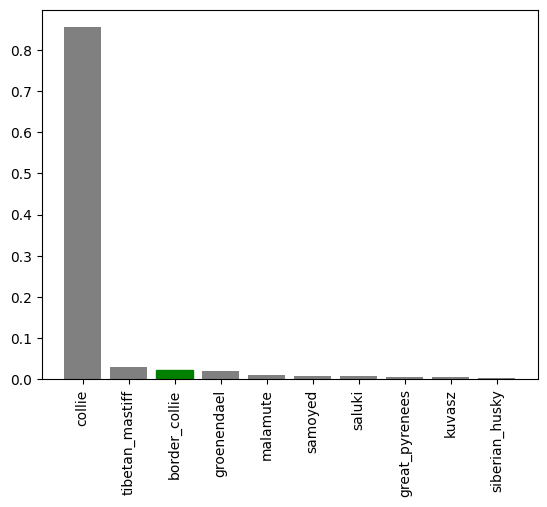

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

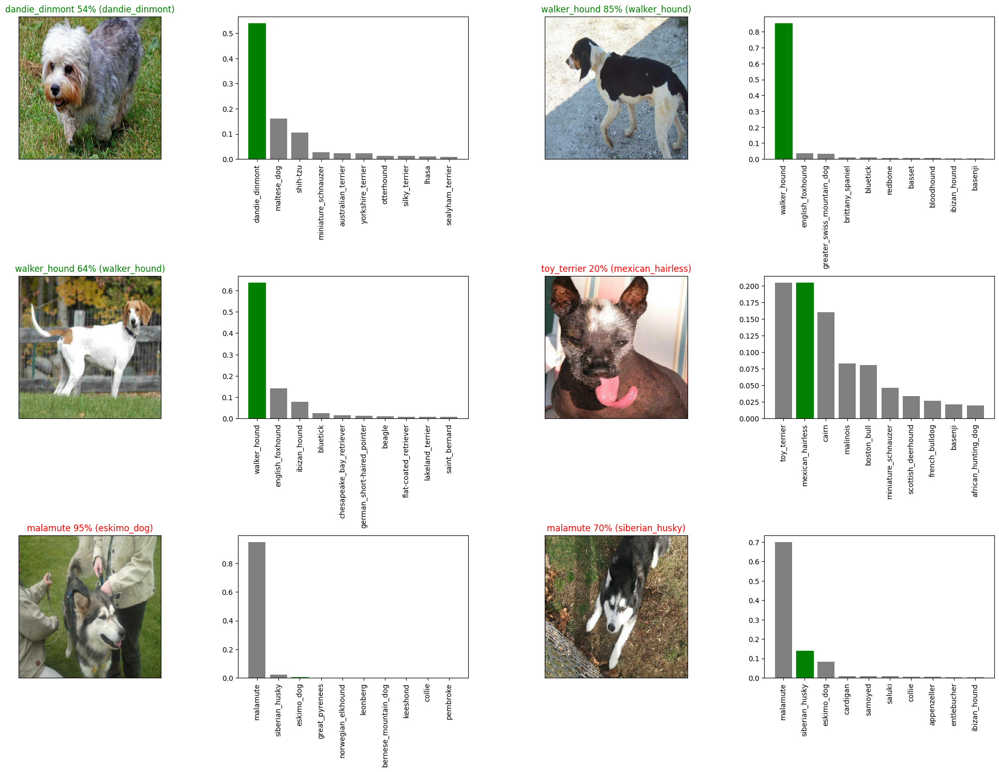

In [ ]:
#let's check out a few predictions and their different values
i_multiplier = 30
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot( num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


# Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


Now we've got functions to save and load a trained model, let's make sure they work!



In [ ]:
#Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240607-05311717738313-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20240607-05311717738313-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/My Drive/Dog Vision/models/20240607-05311717738313-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20240607-05311717738313-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 99ms/step - loss: 1.2055 - accuracy: 0.6850


[1.205450177192688, 0.6850000023841858]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 101ms/step - loss: 1.2055 - accuracy: 0.6850


[1.205450177192688, 0.6850000023841858]

# Training a big dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1444s 4s/step - loss: 1.3148 - accuracy: 0.6773
Epoch 2/100
320/320 [==============================] - 40s 124ms/step - loss: 0.3959 - accuracy: 0.8790
Epoch 3/100
320/320 [==============================] - 41s 128ms/step - loss: 0.2357 - accuracy: 0.9377
Epoch 4/100
320/320 [==============================] - 42s 130ms/step - loss: 0.1512 - accuracy: 0.9631
Epoch 5/100
320/320 [==============================] - 44s 139ms/step - loss: 0.1054 - accuracy: 0.9793
Epoch 6/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0768 - accuracy: 0.9856
Epoch 7/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0591 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0463 - accuracy: 0.9939
Epoch 9/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0379 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 41s 127ms

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240607-06161717740984-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20240607-06161717740984-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20240607-06161717740984-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20240607-06161717740984-full-image-set-mobilenetv2-Adam.h5


# Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we `created create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/f09826fc9cb9aa425caae5f8aaaa8bef.jpg',
 'drive/My Drive/Dog Vision/test/ed2a749830d4ed6544ec3bc2efb9a58a.jpg',
 'drive/My Drive/Dog Vision/test/f47e4614a5d7d190cf95b4b9c1e78576.jpg',
 'drive/My Drive/Dog Vision/test/ee6dad89684bbbab844ecedf70f4be2d.jpg',
 'drive/My Drive/Dog Vision/test/ed61910363f37890c8cc47b25836f82e.jpg',
 'drive/My Drive/Dog Vision/test/f0b37b4b6d1452125b4cb91f08008298.jpg',
 'drive/My Drive/Dog Vision/test/f1c1f35ca91cd9d007f957da29aa087e.jpg',
 'drive/My Drive/Dog Vision/test/ef5c93599bcc330fd9642266d9650309.jpg',
 'drive/My Drive/Dog Vision/test/f58a21665136bb6aa4aa90c485be4315.jpg',
 'drive/My Drive/Dog Vision/test/f16fd3afeb123e25cfe3e712faee8aa5.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 226s 680ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")


In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[5.47382251e-10, 5.30805728e-08, 5.89773741e-08, ...,
        2.36286769e-06, 3.25087429e-04, 2.77683831e-08],
       [3.60478769e-12, 1.37074640e-12, 4.56674585e-12, ...,
        3.00248324e-12, 6.35074328e-12, 1.54312552e-11],
       [1.19050288e-12, 3.97972988e-09, 8.63935919e-12, ...,
        7.64014914e-08, 1.42259858e-04, 1.90976230e-08],
       ...,
       [8.90573466e-12, 1.68208763e-11, 2.43550378e-13, ...,
        5.33996902e-10, 3.87092891e-09, 1.92369840e-12],
       [1.59302857e-07, 3.07484926e-10, 3.89385052e-11, ...,
        1.59616007e-14, 3.09057606e-11, 8.13910137e-12],
       [1.44491466e-07, 4.46486936e-08, 1.45140362e-08, ...,
        1.43665113e-09, 1.10649090e-08, 1.47854671e-05]])

In [ ]:
test_predictions.shape

(10357, 120)

# Preparing test dataset predictions for Kaggle
Looking at the [Kaggle sample submission](https://www.kaggle.com/c/dog-breed-identification/overview/evaluation), it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the `unique_breeds` list and the `test_predictions` list.
* Export the DataFrame as a CSV to submit it to Kaggle.




In [ ]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f09826fc9cb9aa425caae5f8aaaa8bef,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ed2a749830d4ed6544ec3bc2efb9a58a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f47e4614a5d7d190cf95b4b9c1e78576,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ee6dad89684bbbab844ecedf70f4be2d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ed61910363f37890c8cc47b25836f82e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f09826fc9cb9aa425caae5f8aaaa8bef,5.473823e-10,5.308057e-08,5.897737e-08,1.296032e-06,1.644561e-11,4.676051e-08,1.398816e-10,5.920231e-09,1.481667e-11,...,1.310634e-10,9.307254e-10,6.431088e-11,6.631886e-13,2.752437e-10,1.074846e-10,4.485896e-09,2.362868e-06,3.250874e-04,2.776838e-08
1,ed2a749830d4ed6544ec3bc2efb9a58a,3.604788e-12,1.370746e-12,4.566746e-12,7.477491e-10,5.173962e-12,1.097147e-14,3.672535e-07,5.228737e-11,8.578575e-11,...,4.555002e-12,1.596380e-10,5.777305e-11,5.164005e-12,4.956527e-14,9.560918e-14,1.955762e-09,3.002483e-12,6.350743e-12,1.543126e-11
2,f47e4614a5d7d190cf95b4b9c1e78576,1.190503e-12,3.979730e-09,8.639359e-12,1.139645e-01,5.198711e-09,3.002488e-09,1.717912e-08,3.451067e-13,2.100340e-10,...,2.945655e-10,2.631475e-09,4.469243e-09,3.660077e-11,1.342641e-11,3.351620e-09,1.332014e-12,7.640149e-08,1.422599e-04,1.909762e-08
3,ee6dad89684bbbab844ecedf70f4be2d,2.950759e-08,9.248657e-08,7.398532e-13,6.194435e-11,4.843429e-10,3.468195e-11,1.655400e-11,1.213017e-11,1.890048e-10,...,1.333549e-09,3.748150e-13,1.066355e-10,1.365064e-12,1.334538e-10,2.940215e-11,4.951997e-12,1.675080e-14,8.476047e-11,4.467100e-11
4,ed61910363f37890c8cc47b25836f82e,2.148403e-10,6.036103e-09,1.676622e-10,1.915489e-02,8.803210e-12,3.663722e-13,1.277936e-08,4.645788e-14,4.344835e-11,...,7.860173e-08,2.924301e-13,1.814110e-09,6.968667e-09,6.739229e-10,1.886187e-11,1.230250e-11,2.124362e-10,1.011919e-07,5.035171e-10


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

# Making predictions on custom images
It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

To do so, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the test_data parameter to True.
Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

**Note:** To make predictions on custom images, I've uploaded pictures of my own to a directory located at drive/My Drive/Data/dogs/ (as seen in the cell below). In order to make predictions on your own images, you will have to do something similar.



In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/pexels-pixabay-220938.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-valeriya-1805164.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-summerstock-333083.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-vanserline-vandenberg-759843-1619690.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-errfaci-1638724.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-leah-newhouse-50725-540524.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-gilberto-reyes-259461-825947.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-charlesdeluvio-1851164.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-miguelconstantin-2623968.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-abdghat-1684504.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-melly-1954515.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-goochie-poochie-3299901.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-stergerz-803766.jpg',
 'drive

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 6s 6s/step


In [ ]:
custom_preds.shape

(15, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['border_collie',
 'chow',
 'german_shepherd',
 'pekinese',
 'whippet',
 'golden_retriever',
 'boston_bull',
 'pug',
 'miniature_poodle',
 'kuvasz',
 'boston_bull',
 'maltese_dog',
 'siberian_husky',
 'miniature_poodle',
 'lakeland_terrier']

In [ ]:
#Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

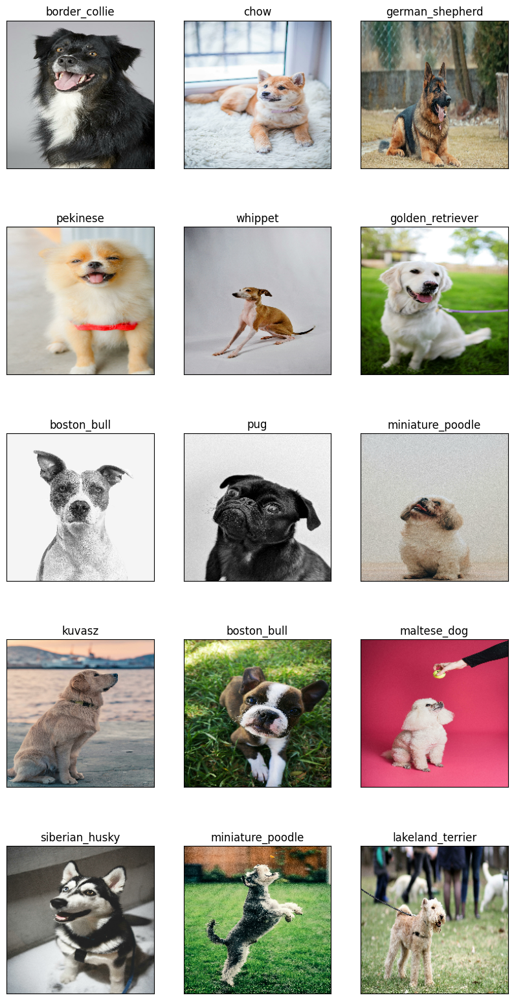

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 20))
for i, image in enumerate(custom_images):
  plt.subplot(5, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

We can finally predict the Breed of Our Own Dog!!

**Happy Coding!!**